<a href="https://colab.research.google.com/github/Ayakhaled200/Machine-Learing/blob/main/Models_from_Scrach/SVD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Saving pexels-fabian-wiktor-994605.jpg to pexels-fabian-wiktor-994605 (1).jpg


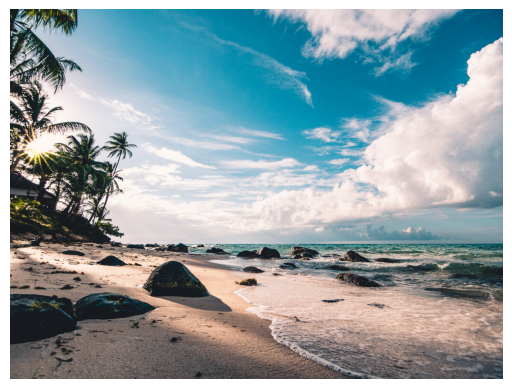

In [ ]:
from google.colab import files
import matplotlib.pyplot as plt
from PIL import Image

# Upload image file
uploaded = files.upload()

# Get the filename of the uploaded image
filename = list(uploaded.keys())[0]

# Open and display the uploaded image
img = Image.open(filename)
plt.imshow(img)
plt.axis('off')
plt.show()


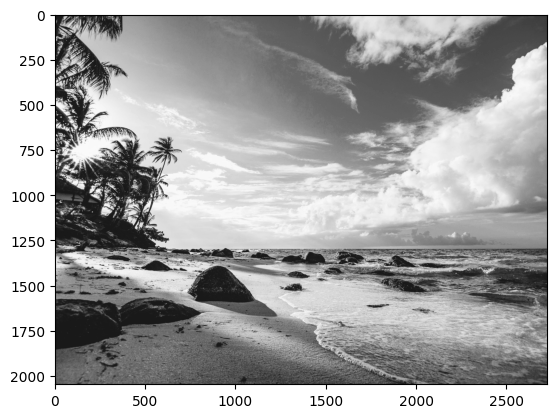

(2726, 2047)


In [ ]:
#merhod 1
# Convert the image to grayscale
gray_img = img.convert('L')

# Display the grayscale image
plt.imshow(gray_img, cmap='gray')
plt.show()

# Get the shape of the grayscale image
shape = gray_img.size
print(shape)

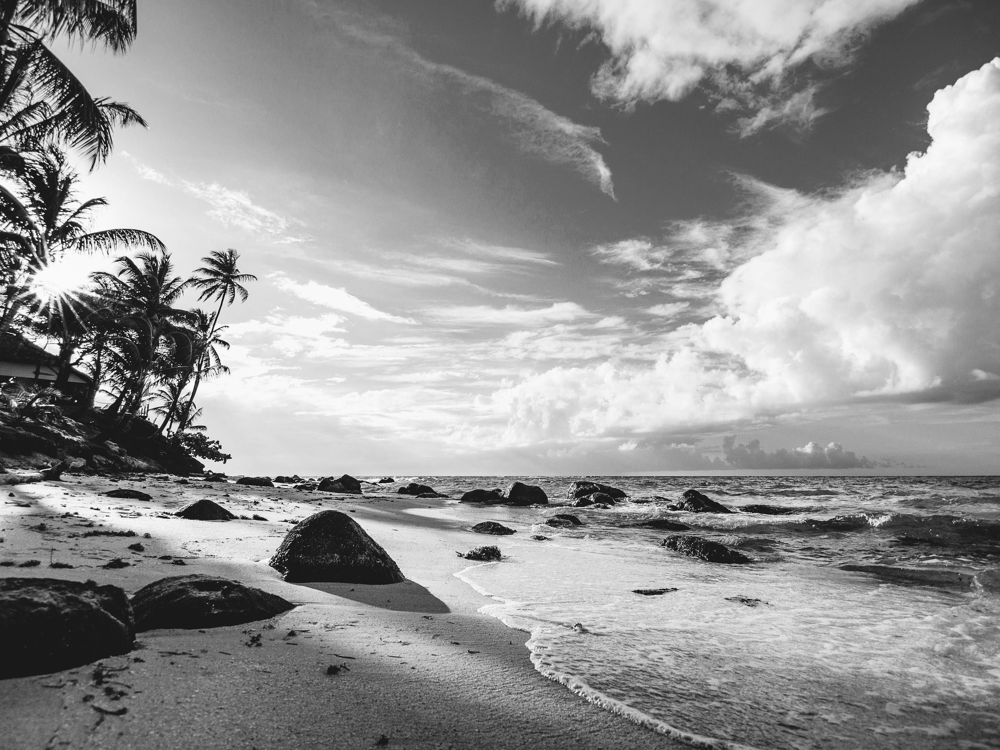

5580122


In [ ]:
#method 2
import cv2
from google.colab.patches import cv2_imshow

# Read the uploaded image
img2 = cv2.imread(filename)

# Convert the image to grayscale
gray_img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Display the grayscale image
cv2_imshow(gray_img2)


In [ ]:
gray_img2.shape

(2047, 2726)

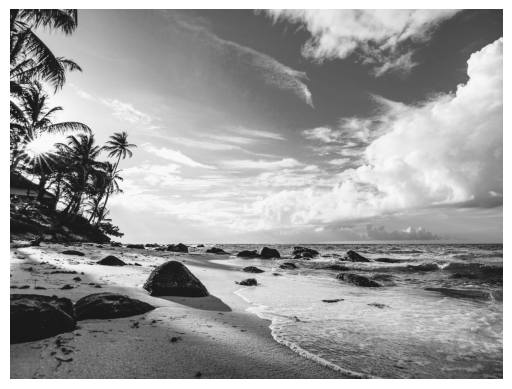

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Read the uploaded image
img3 = mpimg.imread(filename)

# Convert the image to grayscale
gray_img3 = img3.mean(axis=2)

# Display the grayscale image
plt.imshow(gray_img3, cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
img3.shape

(2047, 2726, 3)

In [ ]:
gray_img3.shape

(2047, 2726)

In [ ]:
#singular value decomposition (SVD)
import numpy as np

# Perform SVD
U, S, Vt = np.linalg.svd(gray_img2, full_matrices=False)

# Set the number of singular values to keep for compression
k = 100

# Truncate the matrices
U_k = U[:, :k]
S_k = np.diag(S[:k])
Vt_k = Vt[:k, :]

# Reconstruct the compressed image
compressed_img = np.dot(U_k, np.dot(S_k, Vt_k))


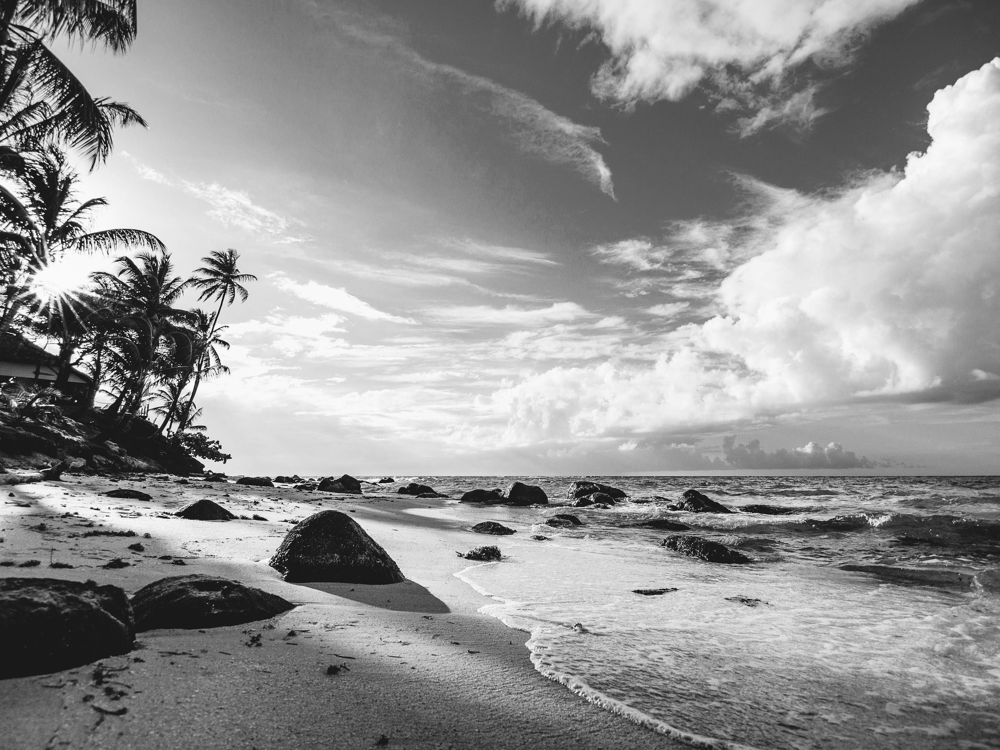

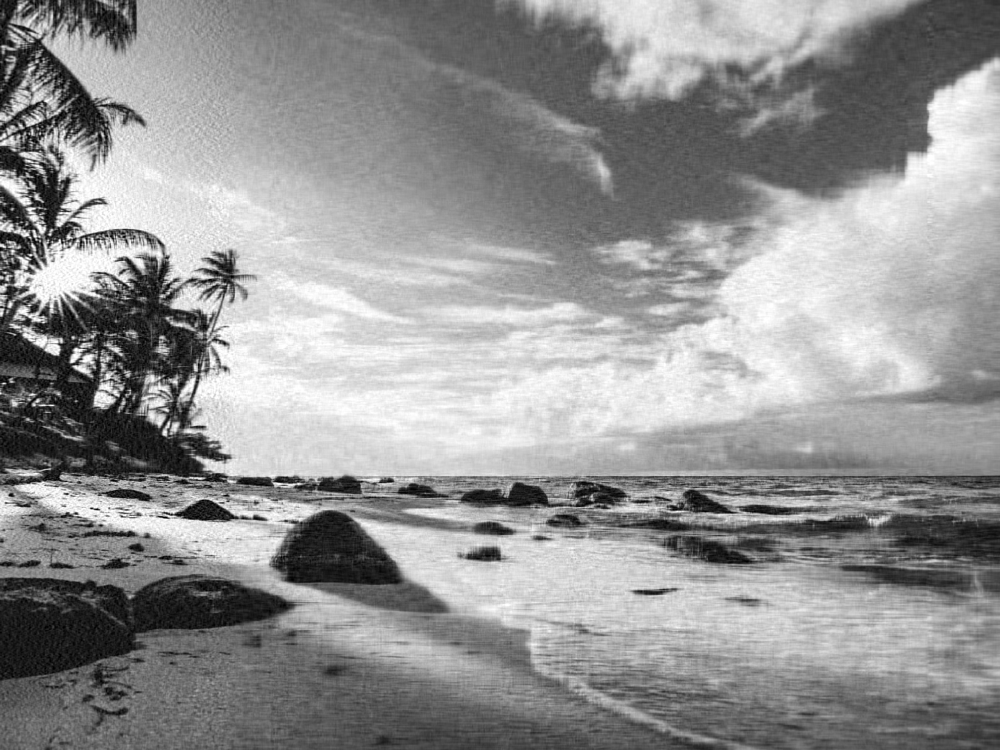

In [ ]:
# Display the compressed image , original gray image
cv2_imshow(gray_img2)
cv2_imshow(compressed_img)

In [ ]:
# Get the dimensions of the grayscale image
compressed_img.shape

(2047, 2726)

In [ ]:
import numpy as np

# Get the original sizes of the matrices
original_U_size = U.size
original_S_size = S.size
original_Vt_size = Vt.size

# Get the sizes of the truncated matrices
compressed_U_size = U_k.size
compressed_S_size = S_k.size
compressed_Vt_size = Vt_k.size

# Calculate compression ratios
CR = (compressed_U_size + compressed_S_size + compressed_Vt_size)/(original_U_size + original_S_size  +original_Vt_size)

print("Compression ratio for U:", CR)


Compression ratio for U: 0.0498650379672174


In [ ]:
import cv2
from skimage.metrics import structural_similarity as ssim

gray_img2 = gray_img2/255
compressed_img = compressed_img/255
# Calculate SSIM
ssim_value = ssim(gray_img2, compressed_img)
print("SSIM:", ssim_value)

# Calculate Mean Squared Error (MSE)
mse = np.mean((gray_img2 - compressed_img) ** 2)
print("MSE:", mse)

# Calculate Euclidean Distance
euclidean_distance = np.linalg.norm(gray_img2 - compressed_img)
print("Euclidean Distance:", euclidean_distance)

SSIM: 0.7983076867238748
MSE: 0.004246836841342855
Euclidean Distance: 153.94111760276328
